In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# Load dataset

# Load your dataset
df = pd.read_csv('Restaurant.csv')

# Display first 5 rows to check columns
df.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Step 3: Create a Base Map

We’ll center the map at the average latitude and longitude of all restaurants:

In [3]:
# Calculate center of the map
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]

# Create a folium map
restaurant_map = folium.Map(location=map_center, zoom_start=5)


Step 4: Add Restaurant Locations

In [4]:
# Add markers for each restaurant
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,  # size of the marker
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=row['Restaurant Name'] if 'Restaurant Name' in df.columns else None
    ).add_to(restaurant_map)

# Display map
restaurant_map


Optional Enhancements

Color-code by rating: fill_color changes based on Aggregate rating.

Cluster markers if there are thousands of restaurants using MarkerCluster.

Example with clustering:

In [5]:
from folium.plugins import MarkerCluster

marker_cluster = MarkerCluster().add_to(restaurant_map)

for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'] if 'Restaurant Name' in df.columns else None
    ).add_to(marker_cluster)

restaurant_map


NameError: name 'restaurant_map' is not defined

# -----------------------------
# Distribution by Country
# -----------------------------

Number of restaurants by country:
 Country Code
1      8652
216     434
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       21
166      20
184      20
191      20
37        4
Name: count, dtype: int64


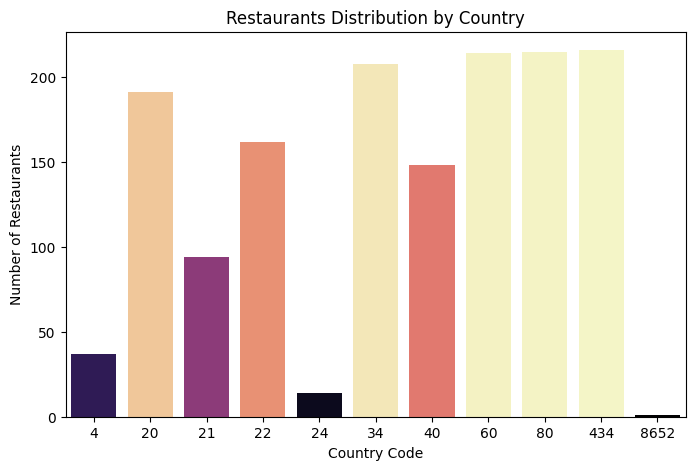

In [12]:
country_counts = df['Country Code'].value_counts()
print("Number of restaurants by country:\n", country_counts)

# Plot
plt.figure(figsize=(8,5))
sns.barplot(
    x=country_counts.values,
    y=country_counts.index,
    palette='magma',
    hue=country_counts.index,  # assign y variable to hue
    dodge=False,             # keep bars single
    legend=False             # remove legend
)
plt.title("Restaurants Distribution by Country")
plt.xlabel("Country Code")
plt.ylabel("Number of Restaurants")
plt.show()

# -----------------------------
# Distribution by City
# -----------------------------


Top 20 cities with most restaurants:
 City
New Delhi          5473
Gurgaon            1118
Noida              1080
Faridabad           251
Ghaziabad            25
Bhubaneshwar         21
Lucknow              21
Ahmedabad            21
Amritsar             21
Guwahati             21
Rio de Janeiro       20
Bras�_lia            20
Albany               20
Doha                 20
Cape Town            20
Manchester           20
London               20
Edinburgh            20
Birmingham           20
Wellington City      20
Name: count, dtype: int64


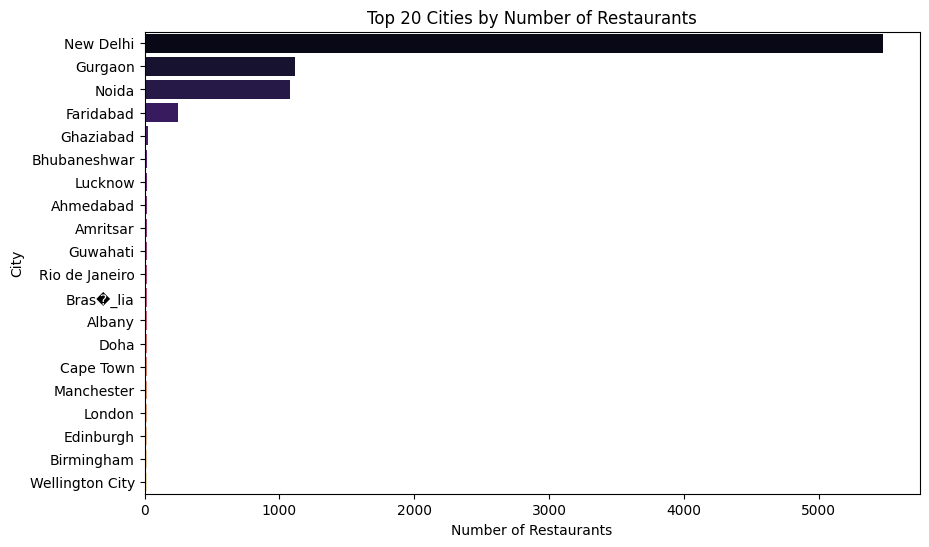

In [10]:
city_counts = df['City'].value_counts().head(20)  # top 20 cities
print("\nTop 20 cities with most restaurants:\n", city_counts)

# Plot
plt.figure(figsize=(10,6))
sns.barplot(
    x=city_counts.values,
    y=city_counts.index,
    palette='magma',
    hue=city_counts.index,  # assign y variable to hue
    dodge=False,             # keep bars single
    legend=False             # remove legend
)
plt.title("Top 20 Cities by Number of Restaurants")
plt.xlabel("Number of Restaurants")
plt.ylabel("City")
plt.show()

Step 2: Correlation Between Location and Rating

Since Latitude and Longitude represent location, we can check if they correlate with Aggregate rating.


Correlation matrix:
                   Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


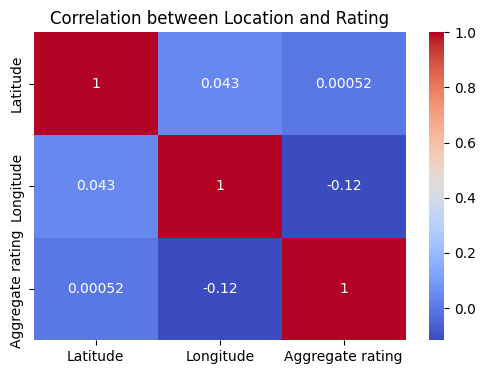

In [9]:
# Convert rating to numeric if needed
df['Aggregate rating'] = pd.to_numeric(df['Aggregate rating'], errors='coerce')

# Correlation matrix for numerical columns
corr_matrix = df[['Latitude','Longitude','Aggregate rating']].corr()
print("\nCorrelation matrix:\n", corr_matrix)

# Heatmap of correlations
plt.figure(figsize=(6,4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation between Location and Rating")
plt.show()
